# Usage for parse ground truth file and show
This is a demo for parse, visulize and split the data, the demo use the data in example folder,
but the folder does not neccessaryly include all the categories.
# 用于标注/显示GT
这是一个用于标注，可视化和分割数据的 demo，这个 demo 用的 data 在 example 文件夹里，但这个文件夹不一定要有所有的目录。

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import os
from DOTA import DOTA
import dota_utils as util
import pylab
pylab.rcParams['figure.figsize'] = (25.0, 25.0)
dota_path = '/home/liuchang/data/DOTA/'
model = 'val'

In [2]:
dataset = DOTA(dota_path + model)
example = DOTA('example')

In [3]:
imgids = example.getImgIds(catNms=['ship', 'storage-tank'])
imgid = imgids[0]
img = example.loadImgs(imgid)[0]

isarralike: False
imgids: ['P2709']
filename: example/images/P2709.png


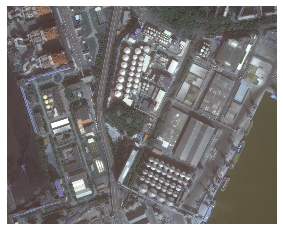

In [4]:
plt.axis('off')

plt.imshow(img)
plt.show()

isarralike: False
imgids: ['P2709']
filename: example/images/P2709.png


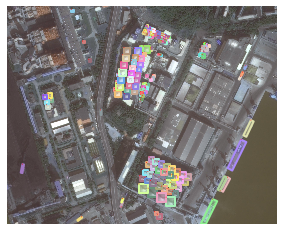

In [5]:
anns = example.loadAnns(imgId=imgid)
# print(anns)
example.showAnns(anns, imgid, 2)

## Split Image And Label
## 分割数据与标签
We provide the scale param before split the images and labels.
Sometimes, the instance is too large that it can be easily cut down(for example, ground track filed), in such case you need to set the param "rate" less than 1.

在分割图片与数据之前提供了一个缩放参数。
有的时候物体实在太大，很容易就被切没了，这个时候 “rate” 参数就要小于1了。

Before going on, first create folder to store the split data

开始之前，首先创建储存分割数据的文件夹
```
  mkdir examplesplit
  mkdir examplesplit/images
  mkdir examplesplit/labelTxt
```
For test images, you only need to split images, refer to "SplitOnlyImage.py"

搞测试图像的时候只需要切图（因为没标注），用 "SplitOnlyImage.py"

In [6]:
from ImgSplit import splitbase

In [14]:
split = splitbase(r'example', 
                 r'examplesplit', choosebestpoint=True)
split.splitdata(0.5)
split.splitdata(1)
split.splitdata(2)

In [15]:
examplesplit = DOTA('examplesplit')

In [16]:
imgids = examplesplit.getImgIds(catNms=['plane'])
imgid = imgids[1]
img = examplesplit.loadImgs(imgid)[0]

isarralike: False
imgids: ['P1088__1__575___0']
filename: examplesplit/images/P1088__1__575___0.png


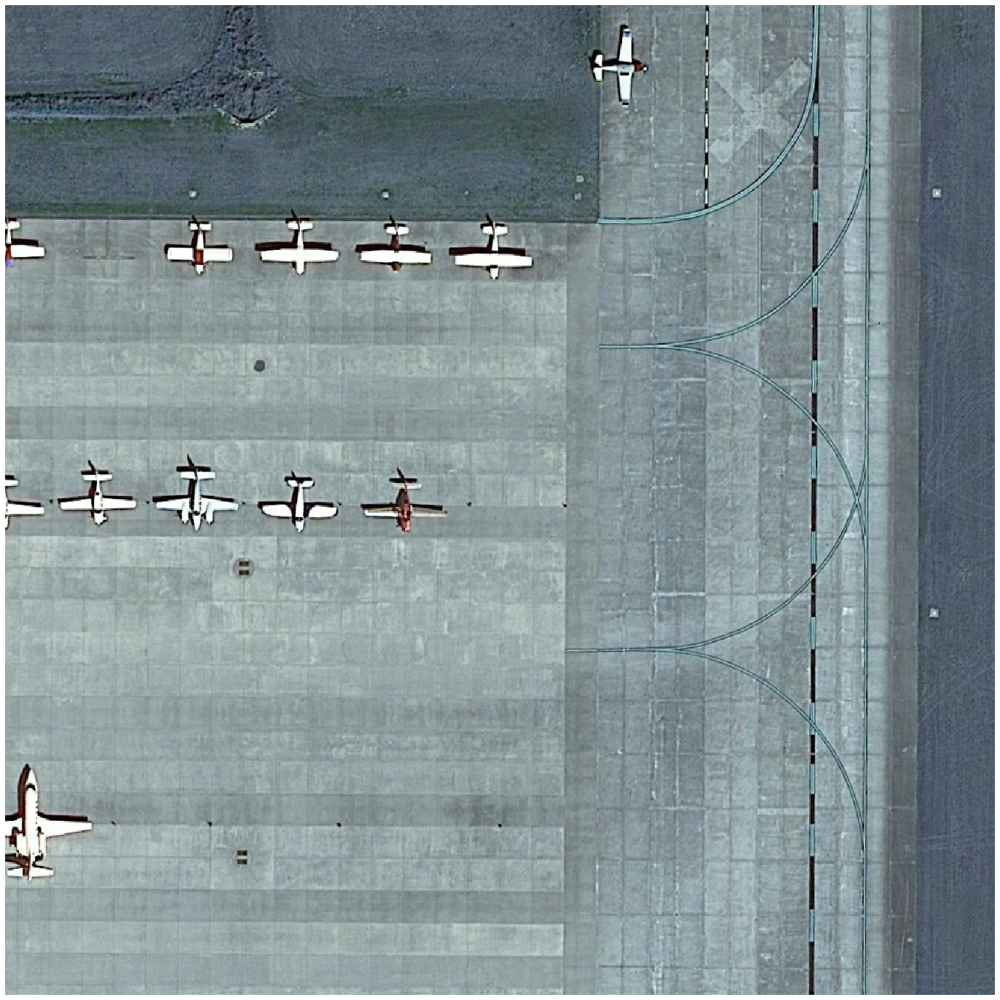

In [17]:
plt.axis('off')

plt.imshow(img)
plt.show()

isarralike: False
imgids: ['P1088__1__575___0']
filename: examplesplit/images/P1088__1__575___0.png


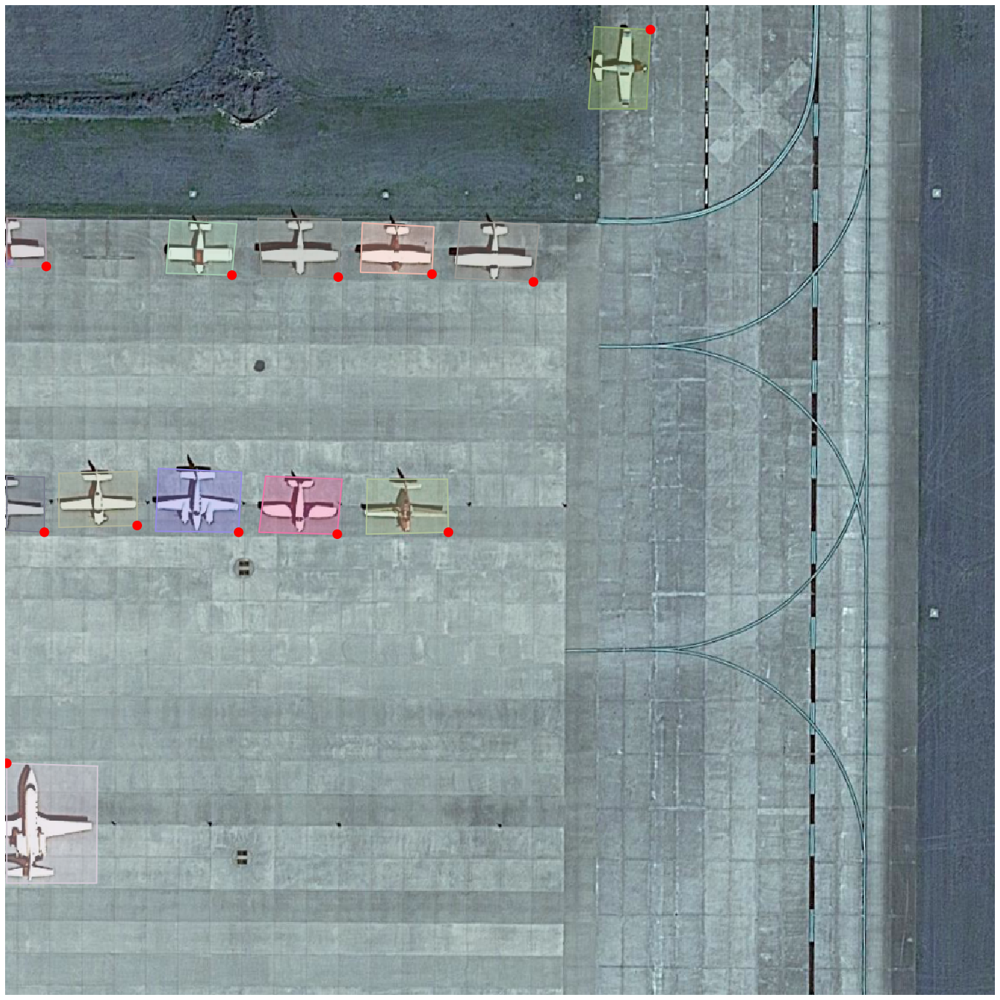

In [18]:
anns = examplesplit.loadAnns(imgId=imgid)
# print(anns)
examplesplit.showAnns(anns, imgid, 2)

## Merge patches
## 融合小补丁

Now, we will merge these patches to see if they can be restored in the initial large images

现在，融合小补丁，康康原来的大图片有没有被放回去

In [19]:
from ResultMerge import mergebypoly

In [20]:
util.groundtruth2Task1(r'examplesplit/labelTxt',
                      r'Task1')
mergebypoly(r'Task1',
           r'Task1_merge')
util.Task2groundtruth_poly(r'Task1_merge',
                          r'restoredexample/labelTxt')

In [21]:
filepath = 'example/labelTxt'
imgids = util.GetFileFromThisRootDir(filepath)
imgids = [util.custombasename(x) for x in imgids]
print(imgids)

['P1088', 'P0706', 'P2598', 'P1888', 'P0770', 'P2709', 'P1234']


isarralike: False
imgids: ['P2598']
filename: example/images/P2598.png


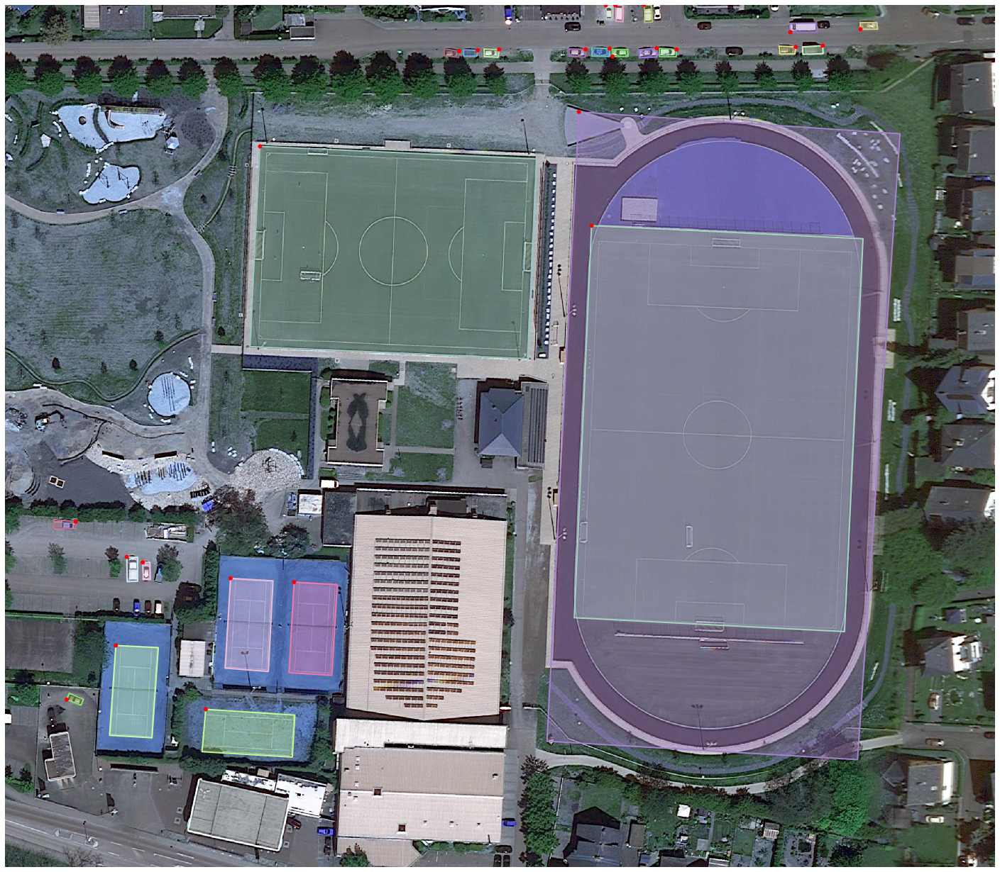

In [22]:
example = DOTA(r'example')
num = 2
anns = example.loadAnns(imgId=imgids[num])
# print(anns)
example.showAnns(anns, imgids[num], 2)

isarralike: False
imgids: ['P2598']
filename: restoredexample/images/P2598.png


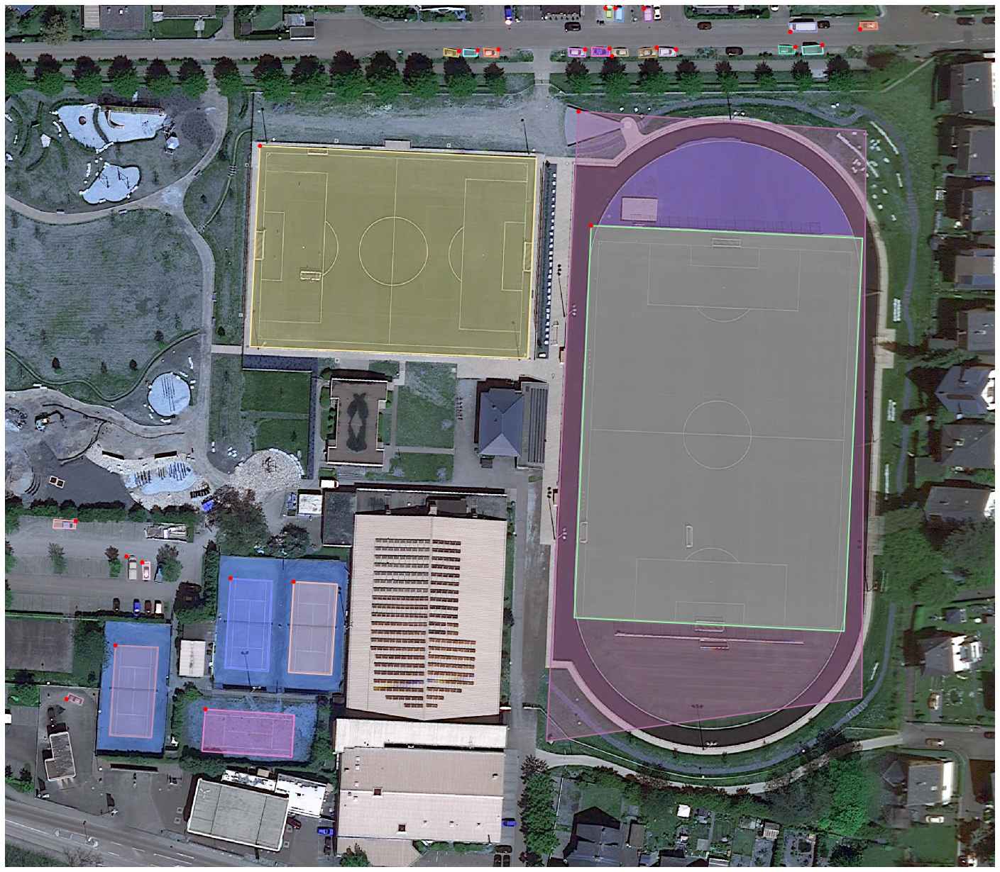

In [26]:
restored = DOTA(r'restoredexample')
num = 2
anns = restored.loadAnns(imgId=imgids[num])
# print(anns)
restored.showAnns(anns, imgids[num], 2)

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import os
from DOTA import DOTA
import dota_utils as util
import pylab
pylab.rcParams['figure.figsize'] = (25.0, 25.0)
dota_path = '/home/liuchang/data/DOTA/'
model = 'val'
from DOTA2COCO import DOTA2COCO
restord = DOTA('/home/liuchang/data/DOTA/ship_car_GSC')
DOTA2COCO('home/liuchang/data/DOTA/ship_car_GSC', '/home/liuchang/data/DOTA/ship_car_GSC/annotations/DOTA_trainval1024.json')

FileNotFoundError: [Errno 2] No such file or directory: '/home/liuchang/data/DOTA/ship_car_GSC/annotations/DOTA_trainval1024.json'